# CS448 - Lab 4: 3D Audio


In this lab we will learn how to create 3D sounds for headphone playback. We will make use of simple filters and HRTFs to create static and moving sources. Use the three sounds ```fly.wav```, ```helicopter.wav```, and ```crumble.wav``` as sources for the 3D recording that you will create.

## Part 1: Static sources using ITD/ILD cues

Assume the sound source is two meter away from the center of your head (i.e., the middle point of the line that connects the two ears). The ears are 22.6 cm apart from each other. Directionality-wise, the source can be in one of the following source locations: 

- Straight ahead

- 45 degrees to the left

- 80 degrees to the right

- 135 degrees to the left

For each location find the source’s delay between the two ears, and design two filters that will simulate that ITD and ILD features (round the ITD delays to an integer sample size, i.e., your sample rate better be high enough). Assume that the direction of arrival angle on the left and right sides are the same, although they are slightly different. Below is an example figure of the first case. 

![alt text](45degrees.jpg)

When sounds come from the side of the head the attenuation at the contralateral ear is by a factor of 0.7. From sounds coming medial plane (between the ears) there will be no attenuation due to the head. For positions moving from the medial plane towards the sides you can interpolate between no attenuation and a factor of 0.7. Design and plot the filters that correspond to the locations shown above and use them to make 3D sounds with the three source signals.

Listen to the result through headphones and verify that they sound somewhat localized (it won’t sound perfect, but it should be believable). Do the 45 degrees left and 135 degrees left examples sound different?

In [2]:
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
import scipy.signal as signal
# Make a sound player function that plays array "x" with a sample rate "rate", and labels it with "label"
def sound_player( x, rate=8000, label=''):
    from IPython.display import display, Audio, HTML
    display( HTML( 
    '<style> table, th, td {border: 0px; }</style> <table><tr><td>' + label + 
    '</td><td>' + Audio( x, rate=rate)._repr_html_()[3:] + '</td></tr></table>'
    ))

44100
(2, 427412)


"Filtered sound, left 45 degrees"


"Filtered sound, left 135 degrees"


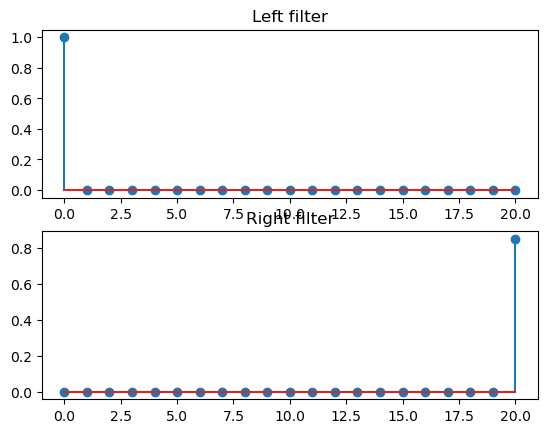

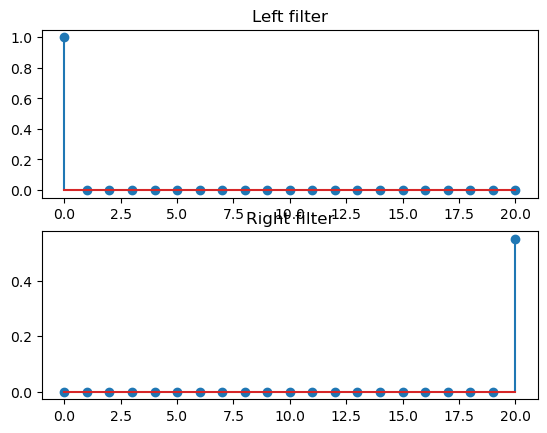

In [5]:
# YOUR CODE HERE
# raise NotImplementedError()

def interaural_filter(fs, azimuth, elevation=0):
    """
    Compute the interaural filter for a given sampling frequency, azimuth and elevation.

    Parameters
    ----------
    fs : int
        Sampling frequency in Hz.
    azimuth : float
        Azimuth angle in degrees. 0 degrees is in front of the listener, 
        positive angles are to the left, and negative angles are to the right.
    elevation : float
        Elevation angle in degrees. default is 0.
    distance : float
        Distance from the sound source in meters.

    

    Returns
    -------
    h : numpy.ndarray
        Interaural filter.
    """

    assert azimuth >= -180 and azimuth <= 180, "Azimuth must be between -180 and 180 degrees."

    head_width=0.226
    sound_speed=343 #meters per second

    # Distance between two arrivals of sound at the two ears
    # Positive distance means that the sound arrives at the left ear first, negative distance means that the sound arrives at the right ear first.
    d=head_width*np.cos(np.pi/2-np.radians(azimuth))

    delay = d/sound_speed
    delay_in_samples = int(delay*fs) 

    attenuation = np.abs(azimuth)/90*0.3


    if azimuth > 0:
        h = np.zeros((2, delay_in_samples+1))
        h[0, 0] = 1
        h[1, -1] = 1-attenuation
    elif azimuth < 0:
        h = np.zeros((2, -delay_in_samples+1))
        h[1, 0] = 1
        h[0, -1] = 1-attenuation
    else:
        h = np.ones((2, 1) )
    return h


    # YOUR CODE HERE
    # raise NotImplementedError()

# Load one of the signals.
x, sr=sf.read('fly.wav')

print(sr)

# Get the filter with the desired azimuth.
h45=interaural_filter(sr, 45) # 45 degrees to the right
h135=interaural_filter(sr, 135) # 135 degrees to the right

# Check out the filters (left and right) by plotting them.

plt.figure()
plt.subplot(2,1,1)
plt.stem(h45[0,:],  label='Left ear')
plt.title('Left filter')
plt.subplot(2,1,2)
plt.stem(h45[1,:],  label='Right ear')
plt.title('Right filter')

# Filter the signal with the left and right filters, and play the sound.
yl=np.convolve(x, h45[0,:], mode='full')
yr=np.convolve(x, h45[1,:], mode='full')
y=np.stack((yl, yr), axis=1)

print(y.T.shape)

sound_player(y.T, sr, label='Filtered sound, left 45 degrees')

plt.figure()
plt.subplot(2,1,1)
plt.stem(h135[0,:],  label='Left ear')
plt.title('Left filter')
plt.subplot(2,1,2)
plt.stem(h135[1,:],  label='Right ear')
plt.title('Right filter')

yl=np.convolve(x, h135[0,:], mode='full')
yr=np.convolve(x, h135[1,:], mode='full')
y=np.stack((yl, yr), axis=1)

sound_player(y.T, sr, label='Filtered sound, left 135 degrees')


## Part 2. Static sources using HRTFs

In the ```hrtf``` directory you will find code for the function ```load_hrtf``` which returns the left and right HRTF filters given as input a source’s azimuth and elevation. These filters will be much better than the ITD/ILD filters for localizing sounds.

Apply the HRTFs on the given sources and create 3D sounds that correspond to the locations given above. For each source, you will beed to convolve it with the left and right HRTF of the desired position and generate two sounds, one for each channel. Verify that they sound correct using headphones; are they better than before? What differences do you observe? The left 45 degrees and left 135 degrees cases... Are they sounding different now? Try different elevation choices. Do you feel the difference?

Tip: When you use these make sure that the sample rates of the HRTFs and the sounds you convolve them with match.  The HRTFs are sampled at 44.1kHz.


Requested (ad, ed)=(45.0, 0.0) -> using elev 0, az 45, file /Users/minje/Library/CloudStorage/OneDrive-UniversityofIllinois-Urbana/Work/Teaching/CS448 ACL 2026 Spring/Labs-Minje/Lab 04/hrtf/compact/elev0/H0e045a.dat


"Filtered sound, left 45 degrees"


Requested (ad, ed)=(135.0, 0.0) -> using elev 0, az 135, file /Users/minje/Library/CloudStorage/OneDrive-UniversityofIllinois-Urbana/Work/Teaching/CS448 ACL 2026 Spring/Labs-Minje/Lab 04/hrtf/compact/elev0/H0e135a.dat


"Filtered sound, left 135 degrees"


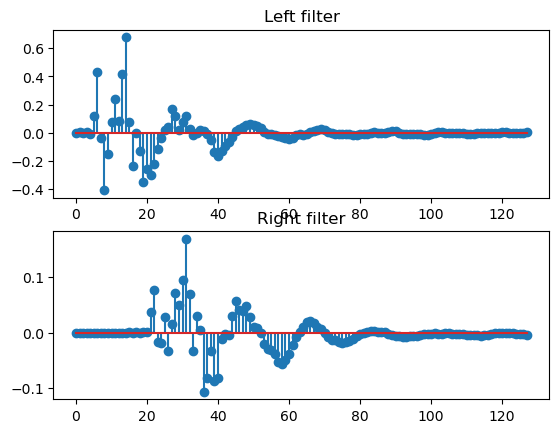

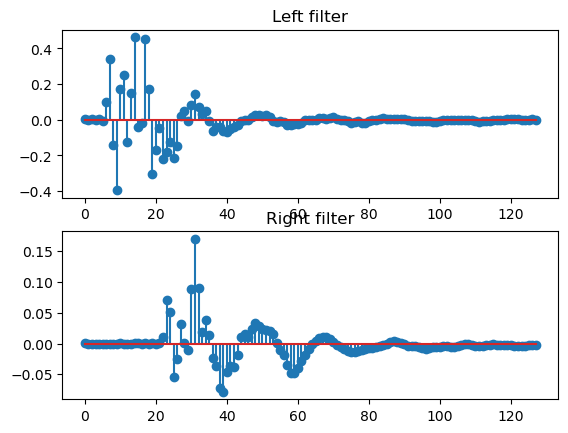

In [ ]:
import hrtf.load_hrtf as load_hrtf
import importlib
importlib.reload(load_hrtf)

x, sr=sf.read('fly.wav')

if sr != 44100:
    x = signal.resample(x, int(len(x) * 44100 / sr))
    sr = 44100

L, R = load_hrtf.load_hrtf(45, 0, verbose=True)

plt.figure()
plt.subplot(2,1,1)
plt.stem(L,  label='Left ear')
plt.title('Left filter')
plt.subplot(2,1,2)
plt.stem(R,  label='Right ear')
plt.title('Right filter')   

yl=np.convolve(x, L, mode='full')
yr=np.convolve(x, R, mode='full')
y=np.stack((yl, yr), axis=1)    
sound_player(y.T, sr, label='Filtered sound, left 45 degrees')


L, R = load_hrtf.load_hrtf(135, 0, verbose=True)

plt.figure()
plt.subplot(2,1,1)
plt.stem(L,  label='Left ear')
plt.title('Left filter')
plt.subplot(2,1,2)
plt.stem(R,  label='Right ear')
plt.title('Right filter')   

yl=np.convolve(x, L, mode='full')
yr=np.convolve(x, R, mode='full')
y=np.stack((yl, yr), axis=1)    
sound_player(y.T, sr, label='Filtered sound, left 135 degrees')

## Part 3. Dynamic Sources with HRTFs

In this part you will need to make a moving sound source. In order to do so we will make use of a fast convolution routine based on your STFT code from lab 1 (ha, you thought you were done with that!). In order to perform fast convolution we can perform an STFT of the sound to use, multiply each time frame of this transform with the DFT of the filter that we want  to impose and then use overlap add to transform back to the time domain.

Start by taking each sound from above, and apply your STFT on it. Make sure that the size of the transform is the same as the HRTF’s filter length. The hop size should be the same as the DFT size and you will need to zero pad each frame by as much as the DFT size in order to facilitate the tail of the convolution. Do not use an analysis/synthesis window.  Also zero pad the HRTF filters and take their DFT, so that you end up with an array which is the same size as each frame of the STFT.

Once you compute this STFT, go through its every time frame and element-wise multiply it with the desired HRTF filter to generate the STFT of the left and right sounds. Figure out which HRTF angle to multiply each frame with so that by the end of the sound you will have made it go around your head.

Once you perform these operations you will have generated two STFT matrices, one for the left channel and one for the right. Use your inverse STFT routine and play the stereo sound through your headphones. You should hear a convincing rendering of the original sounds circling around your head.

In [118]:
def stft( input_sound, frame_size, dft_size, hop_size, window=None):
    """Compute the short-time Fourier transform of a sound.
    Args:
        input_sound: 1D numpy array containing the sound samples
        frame_size: Number of effective samples in each frame (before padding)
        dft_size: Size of the DFT to compute (number of frequency bins; must be >= frame_size)
        hop_size: Number of samples to advance between successive frames 
        window: 1D numpy array containing the analysis window (length = dft_size; default=None, which means no windowing)
    Returns:
        f: 2D numpy array (frequencies x time) containing the complex-valued STFT
    """
    input_sound_length = len(input_sound)
    num_frames = 1 + (input_sound_length - frame_size) // hop_size
    spectrogram = np.zeros((dft_size // 2 + 1, num_frames), dtype=np.complex64)
    zeros=np.zeros(dft_size - frame_size)
    for frame in range(num_frames):
        start = frame * hop_size
        end = start + frame_size
        if window is not None:
            segment = np.concatenate([input_sound[start:end], zeros]) * window
        else:
            segment = np.concatenate([input_sound[start:end], zeros])
        spectrum = np.fft.rfft(segment, n=dft_size)
        spectrogram[:, frame] = spectrum

    # Return a complex-valued spectrogram (frequencies x time)    
    return spectrogram
    # # YOUR CODE HERE
    # raise NotImplementedError()

def istft( stft_output, frame_size, dft_size, hop_size, window=None):
    """Compute the inverse short-time Fourier transform of a spectrogram.
    Args:
        stft_output: 2D numpy array (frequencies x time) containing the complex-valued STFT
        dft_size: Size of the DFT that was computed (number of frequency bins)
        hop_size: Number of samples advanced between successive frames
        window: 1D numpy array containing the synthesis window (length = dft_size)
    Returns:
        x: 1D numpy array containing the reconstructed sound samples
    """
    number_frames = stft_output.shape[1]
    output_length = (number_frames - 1) * hop_size + dft_size
    x = np.zeros(output_length)
    
    for frame in range(number_frames):
        start = frame * hop_size
        end = start + dft_size
        windowed_frame = np.fft.irfft(stft_output[:, frame], n=dft_size)
        if window is not None:
            windowed_frame *= window
        x[start:end] += windowed_frame
    
    return x    

frame_size=512
dft_size=1024
hop_size=512


spectrogram_L = stft(x, frame_size,dft_size, hop_size)
spectrogram_R = spectrogram_L.copy()


num_frames=spectrogram_L.shape[1]

# Linearly moving from (azimuth, elevation) = (60, -30) to (-120, 45)

azimuth_list=np.linspace(60, -120, num_frames)
elevation_list=np.linspace(-30, 45, num_frames)

for i in range(num_frames):
    # print(azimuth_list[i], elevation_list[i])
    L, R = load_hrtf.load_hrtf(azimuth_list[i], elevation_list[i])
    # h=load_hrtf.load_hrtf(azimuth_list[i], elevation_list[i])
    zeros=np.zeros(dft_size - L.shape[0])
    h0=np.concatenate([L, zeros])
    h1=np.concatenate([R, zeros])
    spectrogram_L[:, i] *= np.fft.rfft(h0, n=dft_size)[:dft_size//2+1]
    spectrogram_R[:, i] *= np.fft.rfft(h1, n=dft_size)[:dft_size//2+1]


reconstructed_sound_L = istft(spectrogram_L, frame_size, dft_size, hop_size)
reconstructed_sound_R = istft(spectrogram_R, frame_size, dft_size, hop_size)
y=np.stack((reconstructed_sound_L, reconstructed_sound_R), axis=1)
sound_player(y.T, sr, label='Reconstructed sound')

Reconstructed sound
